In [4]:
from utils import *
import pandas as pd
from time import time
from ptflops import get_model_complexity_info
import matplotlib.pyplot as plt
from tqdm import tqdm
from DataDAM import DataDAM
import os
import matplotlib.pyplot as plt
import pandas as pd
from time import time

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")



# Part 1

In [5]:
class Args:
    def __init__(self):
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'

def train(net, trainloader, criterion, optimizer,device=device, epochs=20):
    net.train()
    net.to(device)
    #create args.device 
    args = Args()
    args.device = device
    progress_bar = tqdm(range(epochs), desc=f'Training - No data available', leave=True)

    for i in progress_bar:
        loss_avg, acc_avg, num_exp = 0, 0, 0
        for i_batch, datum in enumerate(trainloader):
            img = datum[0].float().to(args.device)
            lab = datum[1].long().to(args.device)
            n_b = lab.shape[0]
            output = net(img)[1]
            loss = criterion(output, lab)
            acc = np.sum(np.equal(np.argmax(output.cpu().data.numpy(), axis=-1), lab.cpu().data.numpy()))
            loss_avg += loss.item()*n_b
            acc_avg += acc
            num_exp += n_b

            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        loss_avg /= num_exp
        acc_avg /= num_exp
        progress_bar.set_description(f'Training - Loss: {loss_avg:.4f} - Accuracy: {acc_avg:.4f}')
    return net

def test(net, testloader, criterion, optimizer,device=device, return_acc=False):
    net.eval()
    net.to(device)
    args = Args()
    args.device = device
    loss_avg, acc_avg, num_exp = 0, 0, 0
    for i_batch, datum in enumerate(testloader):
        img = datum[0].float().to(args.device)
        lab = datum[1].long().to(args.device)
        n_b = lab.shape[0]

        output = net(img)[1]
        loss = criterion(output, lab)
        acc = np.sum(np.equal(np.argmax(output.cpu().data.numpy(), axis=-1), lab.cpu().data.numpy()))
        loss_avg += loss.item()*n_b
        acc_avg += acc
        num_exp += n_b


    loss_avg /= num_exp
    acc_avg /= num_exp
    
    if return_acc:
        return acc_avg
    else:
        print(f'Accuracy of the network on the test images: {acc_avg*100}%')

def count_flops(net, channel, im_size):
    param = (channel, im_size[0], im_size[1])
    flops, params = get_model_complexity_info(net, param, as_strings=True, print_per_layer_stat=False)
    print(f'FLOPs: {flops}')
    print(f'Params: {params}')

### Train model

In [3]:
#MNIST Dataset
data_path = "./Project A/data"

#load the dataset
channel, im_size, num_classes, class_names, mean, std, dst_train, dst_test, testloader = get_dataset("MNIST", data_path)

#define the model
net = get_network('ConvNetD3', channel, num_classes, im_size)
net.to(device)

#define the loss function
criterion = nn.CrossEntropyLoss()
#define the optimizer
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
#define the learning rate scheduler
#train the model
#create trainloader
trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
net = train(net, trainloader, criterion, optimizer)

Training - Loss: 0.0125 - Accuracy: 0.9972: 100%|██████████| 20/20 [03:02<00:00,  9.11s/it]


In [4]:
#test the model, report accuracy and FLOPs
#testloader = torch.utils.data.DataLoader(dst_test, batch_size=64, shuffle=False)
test(net, testloader, criterion, optimizer, device)
#report the FLOPs
count_flops(net, channel, im_size) 

Accuracy of the network on the test images: 99.33%
FLOPs: 49.59 MMac
Params: 317.71 k


In [3]:
#MHIST Dataset
#load the dataset
data_path = "mhist_dataset"
#print files in the directory
channel, im_size, num_classes, class_names, mean, std, dst_train, dst_test, testloader = get_dataset("MHIST", data_path)

#define the model
net = get_network('ConvNetD7', channel, num_classes, im_size)
net.to(device) 

#define the loss function
criterion = nn.CrossEntropyLoss()
#define the optimizer
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
#define the learning rate scheduler
#train the model
#create trainloader
trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
net=train(net, trainloader, criterion, optimizer)
            
            

Training - No data available:   0%|          | 0/20 [00:00<?, ?it/s]

Training - Loss: 0.0863 - Accuracy: 0.9936: 100%|██████████| 20/20 [01:33<00:00,  4.69s/it]


In [6]:
#test the model, report accuracy and FLOPs
test(net, testloader, criterion, optimizer, "cpu")
#report the FLOPs
count_flops(net, channel, im_size) 

Accuracy of the network on the test images: 77.37973387922212%
FLOPs: 2.7 GMac
Params: 891.14 k


### Distillation function
Found here https://github.com/DataDistillation/DataDAM/blob/main/main_DataDAM.py

In [3]:
#MNIST Dataset
data_path = "./Project A/data"

#create a folder to save the synthetic dataset
if not os.path.exists(os.path.join(data_path, 'synthetic_dataset_MNIST_gaussian')):
    os.makedirs(os.path.join(data_path, 'synthetic_dataset_MNIST_gaussian'))

#load the dataset
channel, im_size, num_classes, class_names, mean, std, dst_train, dst_test, testloader = get_dataset("MNIST", data_path)

#define the model
net = 'ConvNetD3'

Distillator = DataDAM(net, dst_train, 10, num_classes=num_classes, im_size=im_size, channels=channel, 
                      save_path=os.path.join(data_path, 'synthetic_dataset_MNIST_gaussian'),
                      batch_size=32, K=100, T=10, eta_S = 0.1, zeta_S = 1, eta_theta = 0.01, zeta_theta=50, lambda_mmd=0.01, device="cpu", minibatches_size=256)

mean_gaussian = 0
std_gaussian = 1
#Distillator.initialize_synthetic_dataset_from_gaussian_noise(mean_gaussian,std_gaussian)
#Distillator.initialize_synthetic_dataset_from_real()

trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
condensed_dataset = Distillator.train("Gaussian", mean_gaussian, std_gaussian)




KeyboardInterrupt: 

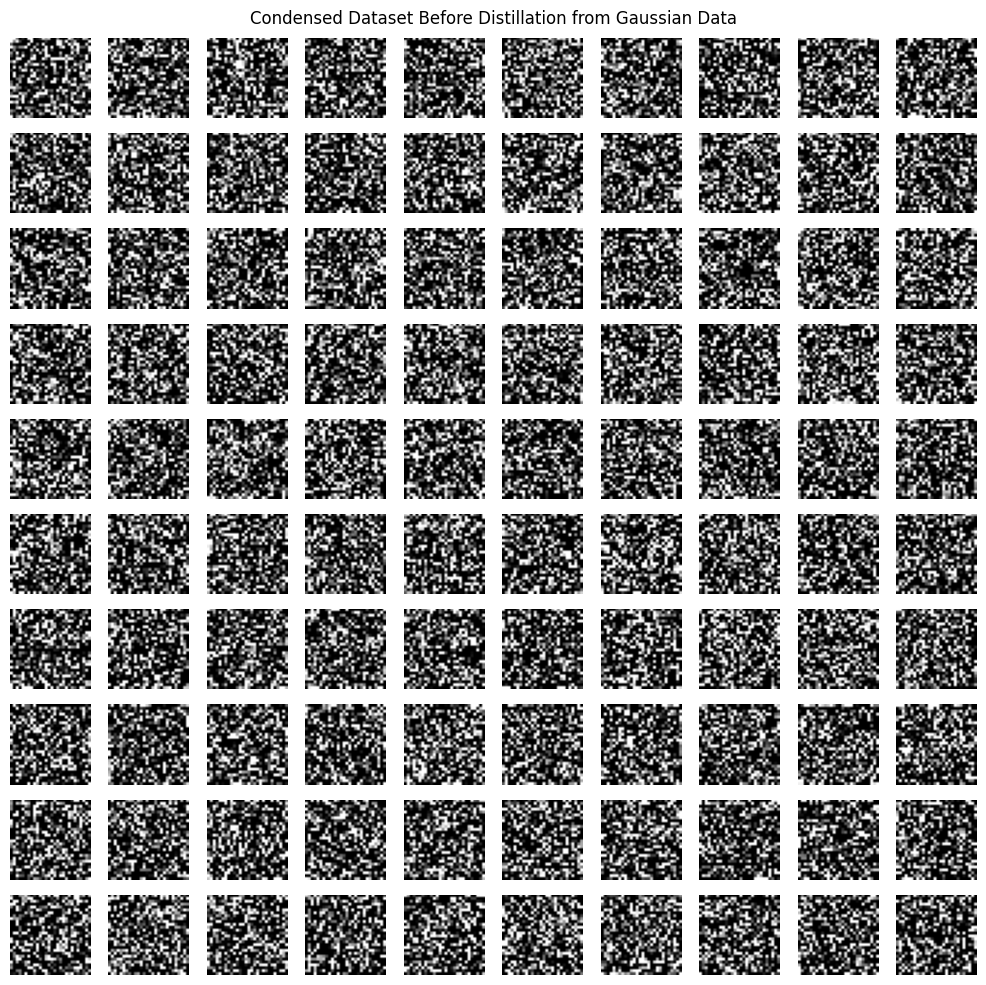

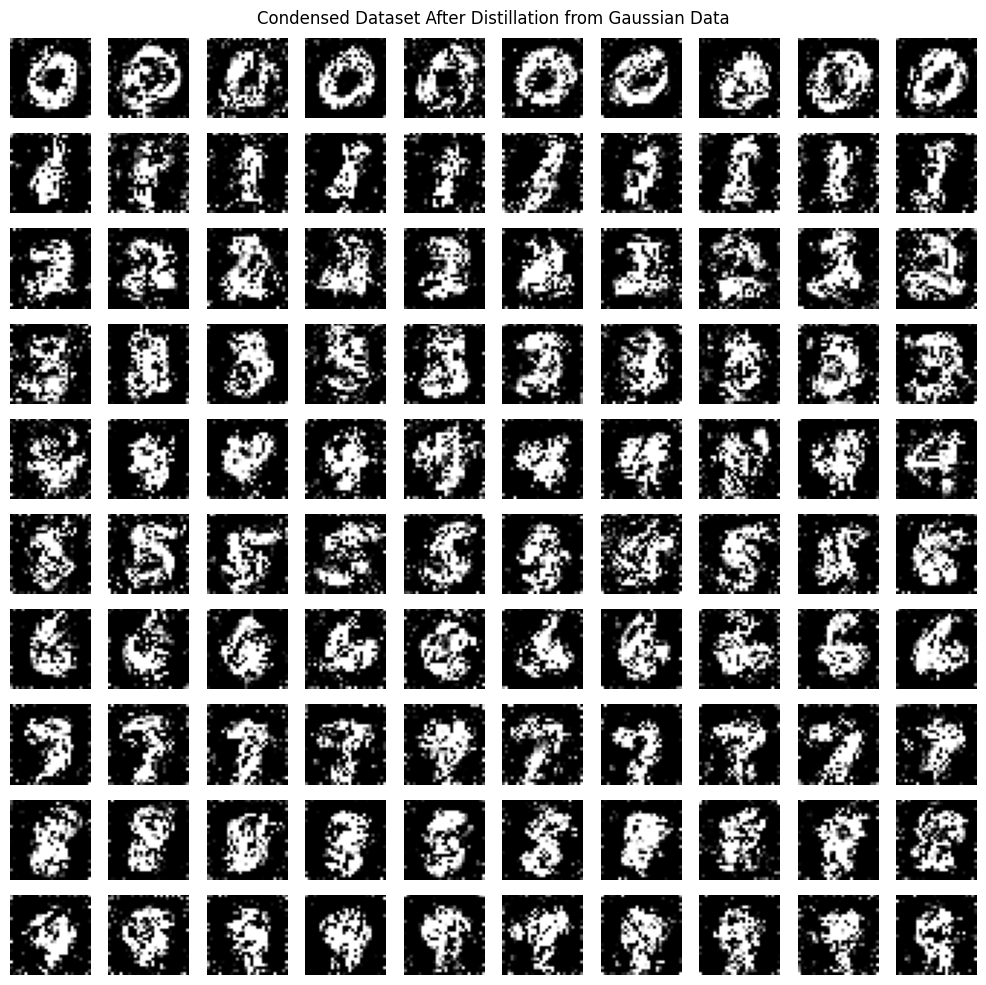

In [4]:
for j in [0, 10]:
    # Create a figure with 10x10 subplots
    fig, ax = plt.subplots(nrows=10, ncols=10, figsize=(10, 10))
    
    # Load the images from the folder
    folder_path = os.path.join(data_path, 'synthetic_dataset_MNIST_gaussian', 'step_' + str(j))
    images = os.listdir(folder_path)
    

    for idx, image in enumerate(images):
        # Open the image
        img = Image.open(os.path.join(folder_path, image))
        
        # Get the row and column indices for the subplot (i.e., 10x10 grid)
        row = idx // 10
        col = idx % 10
        
        # Plot the image in the appropriate subplot
        ax[row, col].imshow(img, cmap='gray')
        ax[row, col].axis('off')  # Hide axis

    # Set the title based on whether it's before or after distillation
    if j == 0:
        fig.suptitle("Condensed Dataset Before Distillation from Gaussian Data")
    else:
        fig.suptitle("Condensed Dataset After Distillation from Gaussian Data")
    
    # Show the plot
    plt.tight_layout()
    plt.show()

In [15]:
#MNIST Dataset
data_path = "./Project A/data"

#create a folder to save the synthetic dataset
if not os.path.exists(os.path.join(data_path, 'synthetic_dataset_MNIST_real')):
    os.makedirs(os.path.join(data_path, 'synthetic_dataset_MNIST_real'))

#load the dataset
channel, im_size, num_classes, class_names, mean, std, dst_train, dst_test, testloader = get_dataset("MNIST", data_path)

#define the model
net = 'ConvNetD3'

Distillator = DataDAM(net, dst_train, 10, num_classes=num_classes, im_size=im_size, channels=channel, 
                      save_path=os.path.join(data_path, 'synthetic_dataset_MNIST_real'),
                      batch_size=32, K=100, T=10, eta_S = 0.1, zeta_S = 1, eta_theta = 0.01, zeta_theta=50, lambda_mmd=0.01, device="cpu", minibatches_size=256)
#Distillator.initialize_synthetic_dataset_from_gaussian_noise(mean_gaussian,std_gaussian)
#Distillator.initialize_synthetic_dataset_from_real()

trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
condensed_dataset = Distillator.train("Real")




Iteration 1/10 - Weight Initializations: 100%|██████████| 100/100 [02:19<00:00,  1.39s/it]


Loss:  12431.509765625 out_loss:  9352.818359375 mid_loss:  3078.696044921875


Iteration 2/10 - Weight Initializations: 100%|██████████| 100/100 [02:18<00:00,  1.39s/it]


Loss:  7719.751953125 out_loss:  6040.66064453125 mid_loss:  1679.089111328125


Iteration 3/10 - Weight Initializations: 100%|██████████| 100/100 [02:20<00:00,  1.40s/it]


Loss:  7796.9736328125 out_loss:  6197.9345703125 mid_loss:  1599.042236328125


Iteration 4/10 - Weight Initializations: 100%|██████████| 100/100 [02:19<00:00,  1.40s/it]


Loss:  12193.2041015625 out_loss:  10354.712890625 mid_loss:  1838.4942626953125


Iteration 5/10 - Weight Initializations: 100%|██████████| 100/100 [02:19<00:00,  1.39s/it]


Loss:  19674.24609375 out_loss:  16860.169921875 mid_loss:  2814.07568359375


Iteration 6/10 - Weight Initializations: 100%|██████████| 100/100 [02:19<00:00,  1.39s/it]


Loss:  21859.064453125 out_loss:  18973.810546875 mid_loss:  2885.26025390625


Iteration 7/10 - Weight Initializations: 100%|██████████| 100/100 [02:19<00:00,  1.39s/it]


Loss:  17528.404296875 out_loss:  15185.7685546875 mid_loss:  2342.641357421875


Iteration 8/10 - Weight Initializations: 100%|██████████| 100/100 [02:19<00:00,  1.39s/it]


Loss:  14271.98828125 out_loss:  12446.5048828125 mid_loss:  1825.4801025390625


Iteration 9/10 - Weight Initializations: 100%|██████████| 100/100 [02:19<00:00,  1.39s/it]


Loss:  11606.5126953125 out_loss:  10187.501953125 mid_loss:  1419.0087890625


Iteration 10/10 - Weight Initializations: 100%|██████████| 100/100 [02:22<00:00,  1.42s/it]


Loss:  10372.77734375 out_loss:  9174.041015625 mid_loss:  1198.737060546875


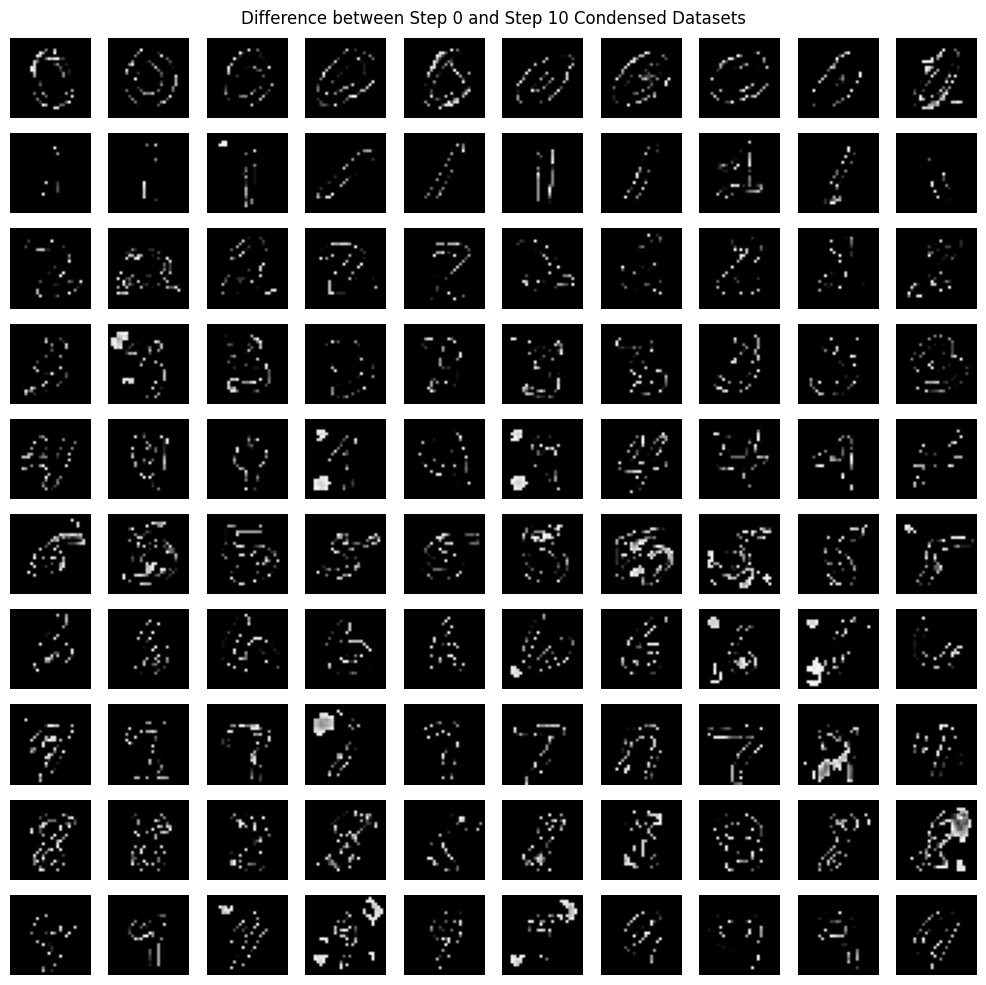

In [9]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

data_path = "./Project A/data"

# Load images from both step 0 and step 10
step_0_folder = os.path.join(data_path, 'synthetic_dataset_MNIST_real', 'step_0')
step_10_folder = os.path.join(data_path, 'synthetic_dataset_MNIST_real', 'step_10')

images_step_0 = os.listdir(step_0_folder)
images_step_10 = os.listdir(step_10_folder)

# Ensure both folders contain the same number of images
assert len(images_step_0) == len(images_step_10), "Mismatch in the number of images between step 0 and step 10."

# Create a figure with 10x10 subplots
fig, ax = plt.subplots(nrows=10, ncols=10, figsize=(10, 10))

# Iterate over the images, compute the difference, and plot them
for idx, (img_0_name, img_10_name) in enumerate(zip(images_step_0, images_step_10)):
    # Open the images from both step 0 and step 10
    img_0 = Image.open(os.path.join(step_0_folder, img_0_name)).convert('L')  # Convert to grayscale
    img_10 = Image.open(os.path.join(step_10_folder, img_10_name)).convert('L')
    
    # Convert the images to numpy arrays
    img_0_np = np.array(img_0)
    img_10_np = np.array(img_10)
    
    # Compute the absolute difference between the two images
    img_diff = np.abs(img_0_np - img_10_np)
    
    # Get the row and column indices for the subplot (i.e., 10x10 grid)
    row = idx // 10
    col = idx % 10
    
    # Plot the difference image in the appropriate subplot
    ax[row, col].imshow(img_diff, cmap='gray')
    ax[row, col].axis('off')  # Hide axis
    
    # Break once 100 images have been plotted (10x10 grid)
    if idx >= 99:
        break

# Set the title for the difference visualization
fig.suptitle("Difference between Step 0 and Step 10 Condensed Datasets")
plt.tight_layout()
plt.show()


IsADirectoryError: [Errno 21] Is a directory: '/Data/GRZ/ECE1512_2024F_ProjectRepo_Grzeczkowicz/Project A/Project A/data/synthetic_dataset_MNIST_real/step_0'

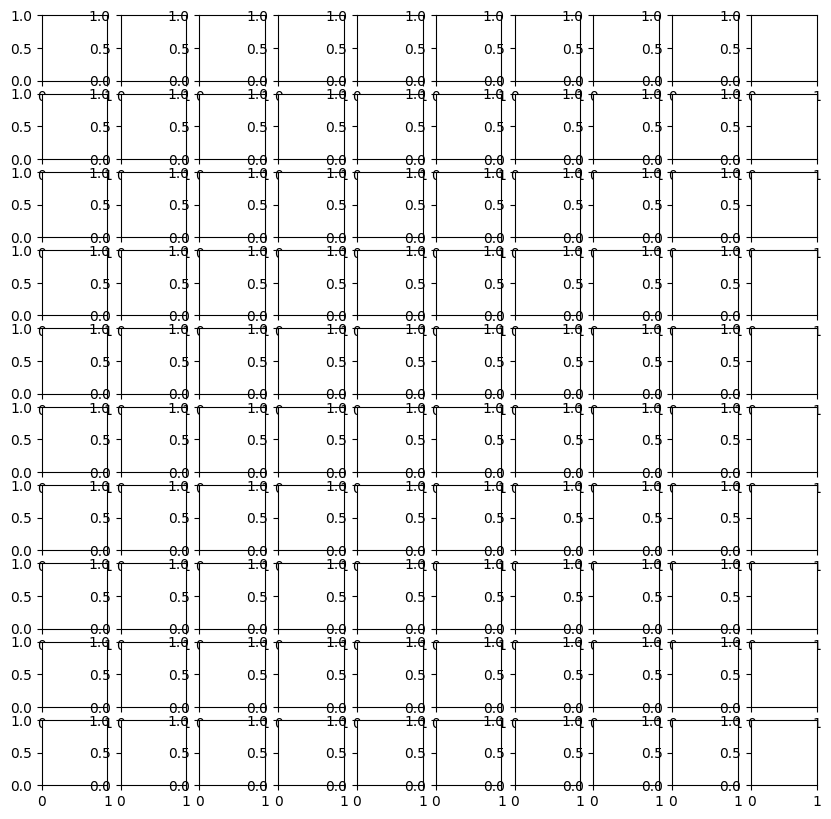

In [8]:
#plot the difference between the step 0 and step 10
folder_path = os.path.join(data_path, 'synthetic_dataset_MNIST_real')
images = os.listdir(folder_path)
fig, ax = plt.subplots(nrows=10, ncols=10, figsize=(10, 10))
for idx, image in enumerate(images):
    # Open the image
    img = Image.open(os.path.join(folder_path, image))
    
    # Get the row and column indices for the subplot (i.e., 10x10 grid)
    row = idx // 10
    col = idx % 10
    
    # Plot the image in the appropriate subplot
    ax[row, col].imshow(img, cmap='gray')
    ax[row, col].axis('off')  # Hide axis
    
# Set the title based on whether it's before or after distillation
fig.suptitle("Difference Between Step 0 and Step 10")

# Show the plot
plt.tight_layout()
plt.show()


In [2]:
data_path = "./Project A/data"

#create a folder to save the synthetic dataset
if not os.path.exists(os.path.join(data_path, 'synthetic_dataset_MHIST_gaussian')):
    os.makedirs(os.path.join(data_path, 'synthetic_dataset_MHIST_gaussian'))

#load the dataset
channel, im_size, num_classes, class_names, mean, std, dst_train, dst_test, testloader = get_dataset("MHIST", "./mhist_dataset")

#define the model
net = 'ConvNetD7'

Distillator = DataDAM(net, dst_train, 50, num_classes=num_classes, im_size=im_size, channels=channel, 
                      save_path=os.path.join(data_path, 'synthetic_dataset_MHIST_gaussian'),
                      batch_size=32, K=200, T=10, eta_S = 100, zeta_S = 1, eta_theta = 0.01, zeta_theta=50, lambda_mmd=0.01, device="cpu", minibatches_size=128)

mean_gaussian = 0
std_gaussian = 1

trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
condensed_dataset = Distillator.train("Gaussian", mean_gaussian, std_gaussian)




KeyboardInterrupt: 

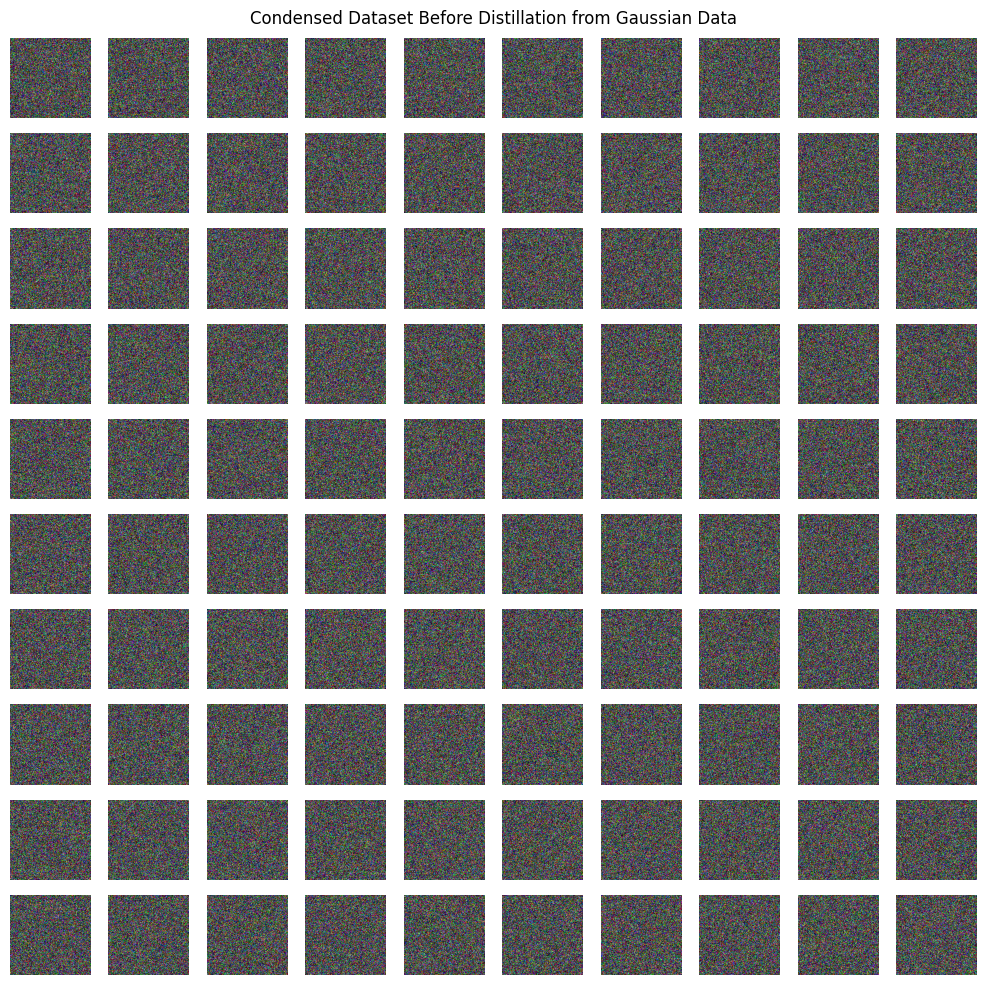

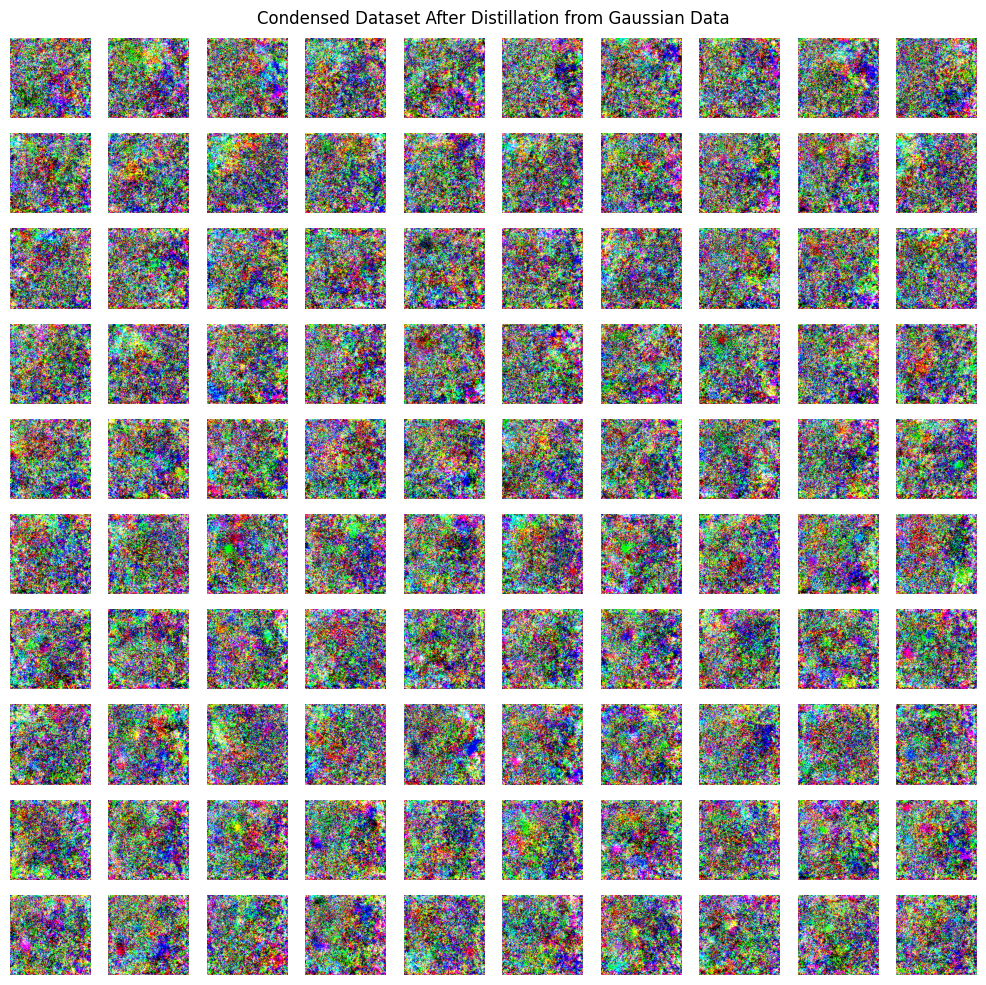

In [4]:
for j in [0, 10]:
    # Create a figure with 10x10 subplots
    fig, ax = plt.subplots(nrows=10, ncols=10, figsize=(10, 10))
    
    # Load the images from the folder
    folder_path = os.path.join(data_path, 'synthetic_dataset_MHIST_gaussian', 'step_' + str(j))
    images = os.listdir(folder_path)
    

    for idx, image in enumerate(images):
        # Open the image
        img = Image.open(os.path.join(folder_path, image))
        
        # Get the row and column indices for the subplot (i.e., 10x10 grid)
        row = idx // 10
        col = idx % 10
        
        # Plot the image in the appropriate subplot
        ax[row, col].imshow(img, cmap='gray')
        ax[row, col].axis('off')  # Hide axis

    # Set the title based on whether it's before or after distillation
    if j == 0:
        fig.suptitle("Condensed Dataset Before Distillation from Gaussian Data")
    else:
        fig.suptitle("Condensed Dataset After Distillation from Gaussian Data")
    
    # Show the plot
    plt.tight_layout()
    plt.show()

In [6]:
data_path = "./Project A/data"

#create a folder to save the synthetic dataset
if not os.path.exists(os.path.join(data_path, 'synthetic_dataset_MHIST_real')):
    os.makedirs(os.path.join(data_path, 'synthetic_dataset_MHIST_real'))

#load the dataset
channel, im_size, num_classes, class_names, mean, std, dst_train, dst_test, testloader = get_dataset("MHIST", "./mhist_dataset")

#define the model
net = 'ConvNetD7'

Distillator = DataDAM(net, dst_train, 50, num_classes=num_classes, im_size=im_size, channels=channel, 
                      save_path=os.path.join(data_path, 'synthetic_dataset_MHIST_real'),
                      batch_size=32, K=200, T=10, eta_S = 1, zeta_S = 1, eta_theta = 0.01, zeta_theta=50, lambda_mmd=0.01, device="cpu", minibatches_size=256)

mean_gaussian = 0
std_gaussian = 1
#Distillator.initialize_synthetic_dataset_from_gaussian_noise(mean_gaussian,std_gaussian)
#Distillator.initialize_synthetic_dataset_from_real()

trainloader = torch.utils.data.DataLoader(dst_train, batch_size=32, shuffle=True)
condensed_dataset = Distillator.train("Real")




/Data/GRZ/ECE1512_2024F_ProjectRepo_Grzeczkowicz/Project A/DataDAM.py:61: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:278.)
  label_syn = torch.tensor([np.ones(self.IPC)*i for i in range(self.num_classes)], dtype=torch.long, requires_grad=False, device=self.device).view(-1) # [0,0,0, 1,1,1, ..., 9,9,9]
Iteration 10/10 - Weight Initializations: 100%|██████████| 200/200 [1:18:48<00:00, 23.64s/it, loss=29.4, mid_loss=19, out_loss=10.5]  


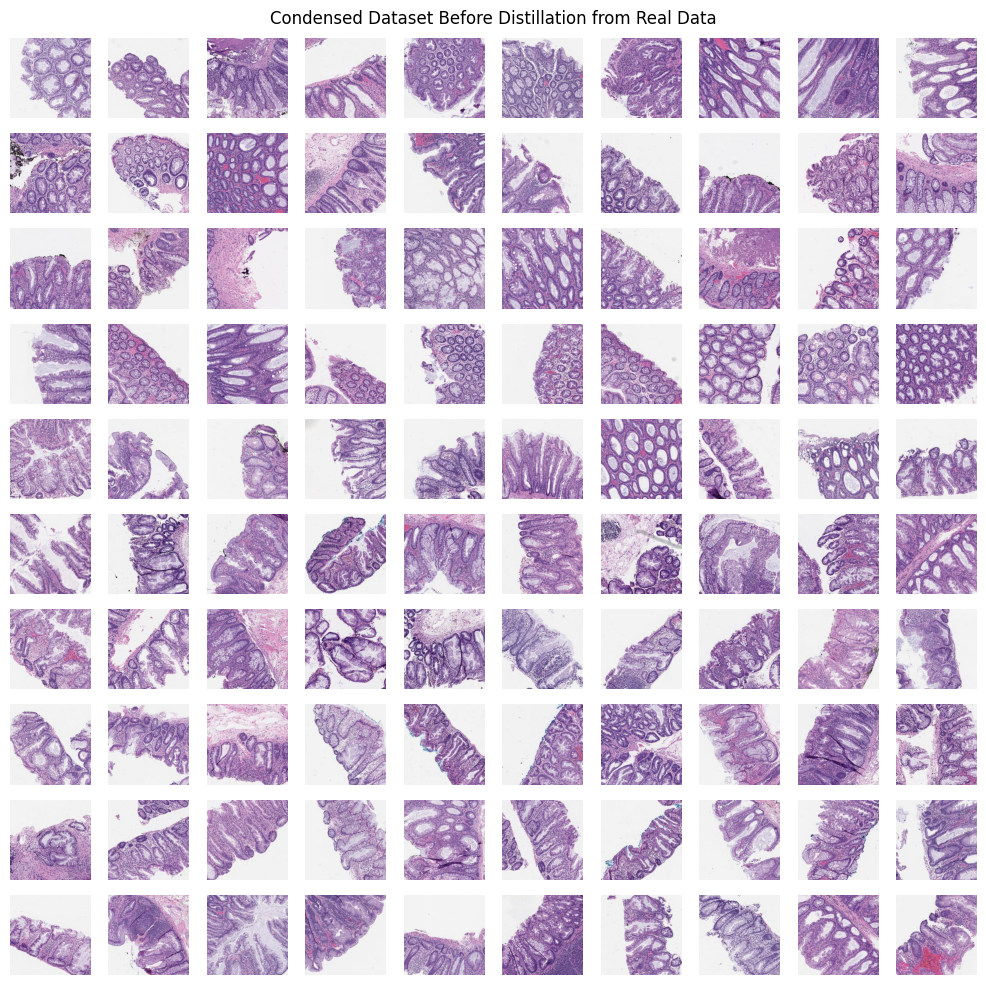

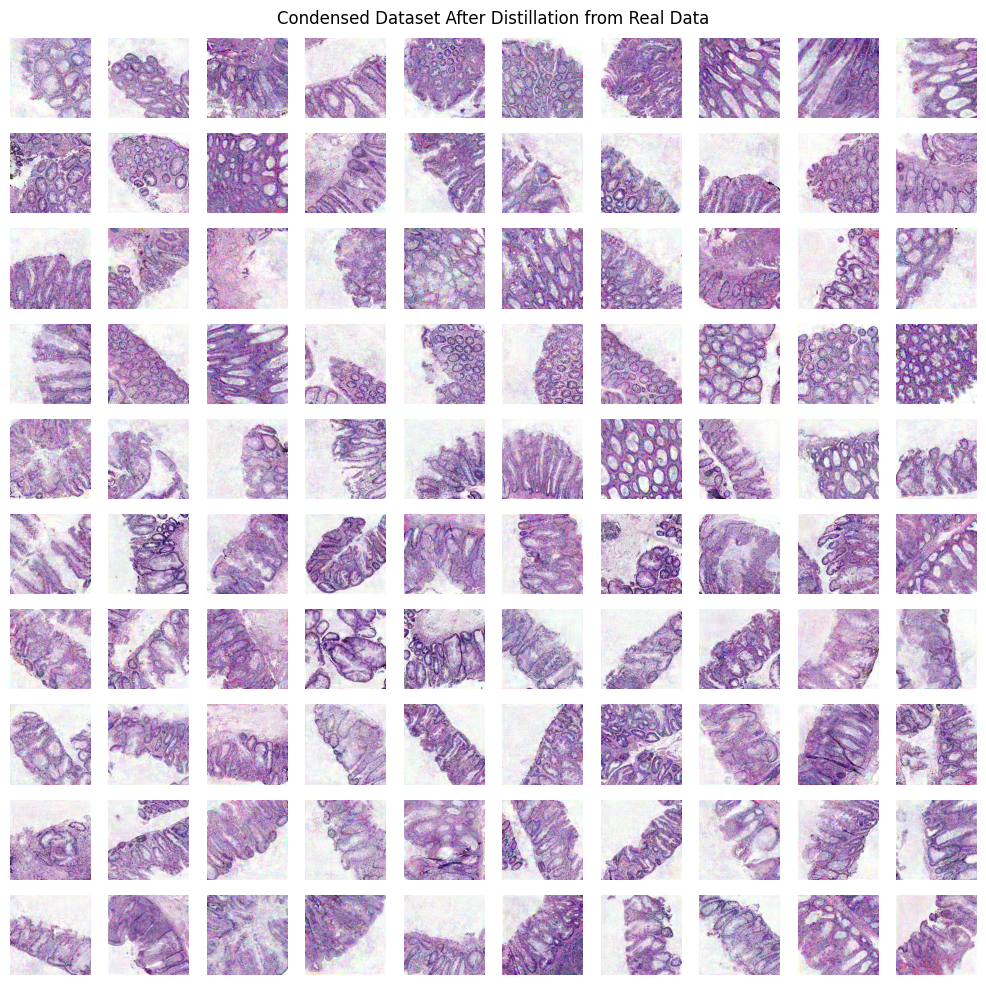

In [7]:
for j in [0, 10]:
    # Create a figure with 10x10 subplots
    fig, ax = plt.subplots(nrows=10, ncols=10, figsize=(10, 10))
    
    # Load the images from the folder
    folder_path = os.path.join(data_path, 'synthetic_dataset_MHIST_real', 'step_' + str(j))
    images = os.listdir(folder_path)
    

    for idx, image in enumerate(images):
        # Open the image
        img = Image.open(os.path.join(folder_path, image))
        
        # Get the row and column indices for the subplot (i.e., 10x10 grid)
        row = idx // 10
        col = idx % 10
        
        # Plot the image in the appropriate subplot
        ax[row, col].imshow(img, cmap='gray')
        ax[row, col].axis('off')  # Hide axis

    # Set the title based on whether it's before or after distillation
    if j == 0:
        fig.suptitle("Condensed Dataset Before Distillation from Real Data")
    else:
        fig.suptitle("Condensed Dataset After Distillation from Real Data")
    
    # Show the plot
    plt.tight_layout()
    plt.show()

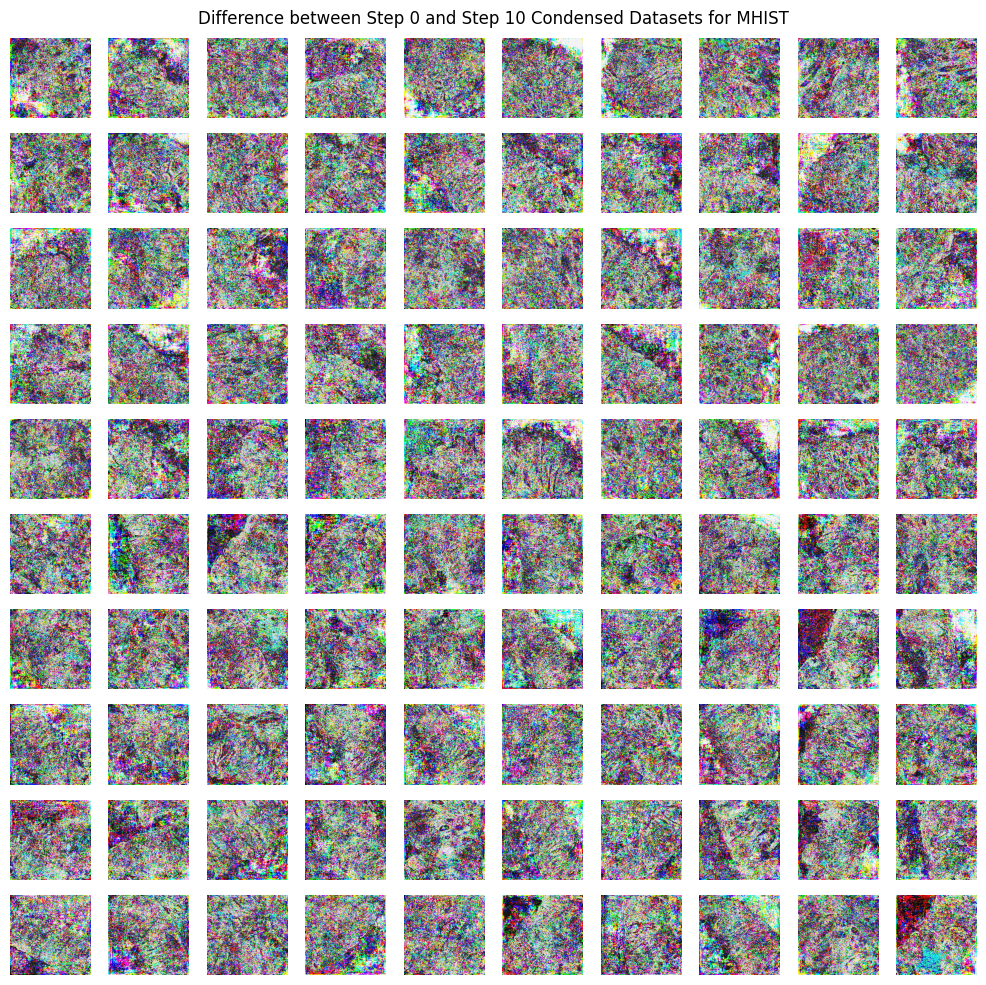

In [11]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

data_path = "./Project A/data"

# Load images from both step 0 and step 10 for MHIST
step_0_folder = os.path.join(data_path, 'synthetic_dataset_MHIST_real', 'step_0')
step_10_folder = os.path.join(data_path, 'synthetic_dataset_MHIST_real', 'step_10')

images_step_0 = os.listdir(step_0_folder)
images_step_10 = os.listdir(step_10_folder)

# Ensure both folders contain the same number of images
assert len(images_step_0) == len(images_step_10), "Mismatch in the number of images between step 0 and step 10."

# Create a figure with 10x10 subplots
fig, ax = plt.subplots(nrows=10, ncols=10, figsize=(10, 10))

# Iterate over the images, compute the difference, and plot them
for idx, (img_0_name, img_10_name) in enumerate(zip(images_step_0, images_step_10)):
    # Open the images from both step 0 and step 10
    img_0 = Image.open(os.path.join(step_0_folder, img_0_name))
    img_10 = Image.open(os.path.join(step_10_folder, img_10_name))
    
    # Convert the images to numpy arrays
    img_0_np = np.array(img_0)
    img_10_np = np.array(img_10)
    
    # Compute the absolute difference between the two images
    img_diff = np.abs(img_0_np - img_10_np)
    
    # Get the row and column indices for the subplot (i.e., 10x10 grid)
    row = idx // 10
    col = idx % 10
    
    # Plot the difference image in the appropriate subplot
    ax[row, col].imshow(img_diff, cmap='gray')
    ax[row, col].axis('off')  # Hide axis
    
    # Break once 100 images have been plotted (10x10 grid)
    if idx >= 99:
        break

# Set the title for the difference visualization
fig.suptitle("Difference between Step 0 and Step 10 Condensed Datasets for MHIST")
plt.tight_layout()
plt.show()


### Training on the condensed dataset MNIST

In [28]:
#MNIST Dataset
data_path = "./Project A/data"

#load the dataset
channel, im_size, num_classes, class_names, mean, std, dst_train, dst_test, testloader = get_dataset("MNIST", data_path)

#define the model
net = get_network('ConvNetD3', channel, num_classes, im_size)
net.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
net = train(net, trainloader, criterion, optimizer, device=device, epochs = 50)
#test the model, report accuracy and FLOPs
print("MNIST - Testing on the test dataset after training on the real dataset")
test(net, testloader, criterion, optimizer, device)

Training - No data available:   0%|          | 0/50 [00:00<?, ?it/s]

Training - Loss: 0.0023 - Accuracy: 0.9999: 100%|██████████| 50/50 [07:07<00:00,  8.56s/it]


Testing on the test dataset after training on the real dataset
Accuracy of the network on the test images: 99.49%


In [29]:
folder_path = os.path.join(data_path, 'synthetic_dataset_MNIST_gaussian')
dst_train = []
labels = []
folder_path = os.path.join(data_path, 'synthetic_dataset_MNIST_gaussian', 'step_10')
images = os.listdir(folder_path)
for image in images:
    img = Image.open(os.path.join(folder_path, image))
    label = int(image.split('_')[1].split('.')[0])//10
    img = img.convert('L')
    img = transforms.ToTensor()(img)
    dst_train.append((img, label))

trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
net = get_network('ConvNetD3', channel, num_classes, im_size)
net.to(device)
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
criterion = nn.CrossEntropyLoss()
net = train(net, trainloader, criterion, optimizer, epochs = 50)
print("MNIST - Testing on the test dataset after training on the condensed dataset computed from Gaussian data")
test(net, testloader, criterion, optimizer, device)


Training - Loss: 0.5912 - Accuracy: 0.9800:  38%|███▊      | 19/50 [00:00<00:00, 183.27it/s]

Training - Loss: 0.3097 - Accuracy: 1.0000: 100%|██████████| 50/50 [00:00<00:00, 182.11it/s]


Testing on the test dataset after training on the condensed dataset computed from Gaussian data
Accuracy of the network on the test images: 74.44%


In [30]:
folder_path = os.path.join(data_path, 'synthetic_dataset_MNIST_real')
dst_train = []
folder_path = os.path.join(data_path, 'synthetic_dataset_MNIST_real', 'step_10')
images = os.listdir(folder_path)
for image in images:
    img = Image.open(os.path.join(folder_path, image))
    label = int(image.split('_')[1].split('.')[0])//10
    img = img.convert('L')
    img = transforms.ToTensor()(img)
    dst_train.append((img, label))

trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
net = get_network('ConvNetD3', channel, num_classes, im_size)
net.to(device)
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
criterion = nn.CrossEntropyLoss()
net = train(net, trainloader, criterion, optimizer, epochs = 50)
print("MNIST - Testing on the test dataset after training on the condensed dataset computed from real data")
test(net, testloader, criterion, optimizer, device)


Training - Loss: 0.5894 - Accuracy: 0.9600:  38%|███▊      | 19/50 [00:00<00:00, 183.09it/s]

Training - Loss: 0.2869 - Accuracy: 0.9900: 100%|██████████| 50/50 [00:00<00:00, 181.92it/s]


Testing on the test dataset after training on the condensed dataset computed from real data
Accuracy of the network on the test images: 91.81%


### Training on the condensed dataset MHIST

In [8]:
data_path = "./mhist_dataset"
channel, im_size, num_classes, class_names, mean, std, dst_train, dst_test, testloader = get_dataset("MHIST", data_path)
net = get_network('ConvNetD7', channel, num_classes, im_size)
net.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
net = train(net, trainloader, criterion, optimizer, device=device, epochs = 50)
print("MHIST - Testing on the test dataset after training on the real dataset")
test(net, testloader, criterion, optimizer, "cpu")

Training - No data available:   0%|          | 0/50 [00:00<?, ?it/s]

Training - Loss: 0.0035 - Accuracy: 1.0000: 100%|██████████| 50/50 [06:12<00:00,  7.44s/it]


MHIST - Testing on the test dataset after training on the real dataset
Accuracy of the network on the test images: 80.14329580348004%


In [11]:
folder_path = os.path.join(data_path, 'synthetic_dataset_MHIST_gaussian')
dst_train = []
labels = []
folder_path = os.path.join('Project A/data', 'synthetic_dataset_MHIST_gaussian', 'step_10')
images = os.listdir(folder_path)
for image in images:
    img = Image.open(os.path.join(folder_path, image))
    label = int(image.split('_')[1].split('.')[0])//50
    img = transforms.ToTensor()(img)
    dst_train.append((img, label))

trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
net = get_network('ConvNetD7', channel, num_classes, im_size)
net.to(device)
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
criterion = nn.CrossEntropyLoss()
net = train(net, trainloader, criterion, optimizer, epochs = 50)
print("MHIST - Testing on the test dataset after training on the condensed dataset computed from Gaussian data")
test(net, testloader, criterion, optimizer, "cpu")


Training - No data available:   0%|          | 0/50 [00:00<?, ?it/s]

Training - Loss: 0.0709 - Accuracy: 1.0000: 100%|██████████| 50/50 [00:10<00:00,  4.78it/s]


MHIST - Testing on the test dataset after training on the condensed dataset computed from Gaussian data
Accuracy of the network on the test images: 53.63357215967247%


In [14]:
folder_path = os.path.join(data_path, 'synthetic_dataset_MHIST_real')
dst_train = []
labels = []
folder_path = os.path.join('Project A/data', 'synthetic_dataset_MHIST_real', 'step_10')
images = os.listdir(folder_path)
for image in images:
    img = Image.open(os.path.join(folder_path, image))
    label = int(image.split('_')[1].split('.')[0])//50
    img = transforms.ToTensor()(img)
    dst_train.append((img, label))

trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
net = get_network('ConvNetD7', channel, num_classes, im_size)
net.to(device)
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
criterion = nn.CrossEntropyLoss()
net = train(net, trainloader, criterion, optimizer, epochs = 50)
print("MHIST - Testing on the test dataset after training on the condensed dataset computed from Real data")
test(net, testloader, criterion, optimizer, "cpu")

Training - Loss: 0.0863 - Accuracy: 1.0000: 100%|██████████| 50/50 [00:10<00:00,  4.77it/s]


MHIST - Testing on the test dataset after training on the condensed dataset computed from Real data
Accuracy of the network on the test images: 63.868986693961105%


### Testing cross architecture

#### MNIST

In [3]:
#MNIST Dataset
data_path = "./Project A/data"

#load the dataset
channel, im_size, num_classes, class_names, mean, std, dst_train, dst_test, testloader = get_dataset("MNIST", data_path)
#define the model
net = get_network('AlexNet', channel, num_classes, im_size)
net.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
net = train(net, trainloader, criterion, optimizer, device=device, epochs = 50)
#test the model, report accuracy and FLOPs
print("MNIST - Testing on the test dataset after training on the real dataset")
test(net, testloader, criterion, optimizer, device)

(28, 28)


Training - Loss: 0.0822 - Accuracy: 0.9738:   6%|▌         | 3/50 [00:33<08:37, 11.01s/it]


KeyboardInterrupt: 

In [18]:
folder_path = os.path.join(data_path, 'synthetic_dataset_MNIST_gaussian')
dst_train = []
labels = []
folder_path = os.path.join(data_path, 'synthetic_dataset_MNIST_gaussian', 'step_10')
images = os.listdir(folder_path)
for image in images:
    img = Image.open(os.path.join(folder_path, image))
    label = int(image.split('_')[1].split('.')[0])//10
    img = img.convert('L')
    img = transforms.ToTensor()(img)
    dst_train.append((img, label))

trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
net = get_network('AlexNet', channel, num_classes, im_size)
net.to(device)
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
criterion = nn.CrossEntropyLoss()
net = train(net, trainloader, criterion, optimizer, epochs = 50)
print("MNIST - Testing on the test dataset after training on the condensed dataset computed from Gaussian data")
test(net, testloader, criterion, optimizer, device)


Training - Loss: 2.3024 - Accuracy: 0.0900:   0%|          | 0/50 [00:00<?, ?it/s]

Training - Loss: 2.2979 - Accuracy: 0.2500: 100%|██████████| 50/50 [00:00<00:00, 64.12it/s]


MNIST - Testing on the test dataset after training on the condensed dataset computed from Gaussian data
Accuracy of the network on the test images: 17.9%


In [19]:
folder_path = os.path.join(data_path, 'synthetic_dataset_MNIST_real')
dst_train = []
folder_path = os.path.join(data_path, 'synthetic_dataset_MNIST_real', 'step_10')
images = os.listdir(folder_path)
for image in images:
    img = Image.open(os.path.join(folder_path, image))
    label = int(image.split('_')[1].split('.')[0])//10
    img = img.convert('L')
    img = transforms.ToTensor()(img)
    dst_train.append((img, label))

trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
net = get_network('AlexNet', channel, num_classes, im_size)
net.to(device)
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
criterion = nn.CrossEntropyLoss()
net = train(net, trainloader, criterion, optimizer, epochs = 50)
print("MNIST - Testing on the test dataset after training on the condensed dataset computed from real data")
test(net, testloader, criterion, optimizer, device)


Training - Loss: 2.3019 - Accuracy: 0.1800:  14%|█▍        | 7/50 [00:00<00:00, 64.56it/s]

Training - Loss: 2.2987 - Accuracy: 0.2400: 100%|██████████| 50/50 [00:00<00:00, 64.77it/s]


MNIST - Testing on the test dataset after training on the condensed dataset computed from real data
Accuracy of the network on the test images: 23.48%


#### MHIST

In [3]:
data_path = "./mhist_dataset"
channel, im_size, num_classes, class_names, mean, std, dst_train, dst_test, testloader = get_dataset("MHIST", data_path)
net = get_network('AlexNet', channel, num_classes, im_size)
net.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
net = train(net, trainloader, criterion, optimizer, device=device, epochs = 50)
print("MHIST - Testing on the test dataset after training on the real dataset")
test(net, testloader, criterion, optimizer, "cpu")

Training - No data available:   0%|          | 0/50 [00:00<?, ?it/s]

Training - Loss: 0.5148 - Accuracy: 0.7605: 100%|██████████| 50/50 [06:40<00:00,  8.00s/it]


MHIST - Testing on the test dataset after training on the real dataset
Accuracy of the network on the test images: 68.37256908904811%


In [5]:
folder_path = os.path.join(data_path, 'synthetic_dataset_MHIST_gaussian')
dst_train = []
labels = []
folder_path = os.path.join('Project A/data', 'synthetic_dataset_MHIST_gaussian', 'step_10')
images = os.listdir(folder_path)
for image in images:
    img = Image.open(os.path.join(folder_path, image))
    label = int(image.split('_')[1].split('.')[0])//50
    img = transforms.ToTensor()(img)
    dst_train.append((img, label))

trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
net = get_network('AlexNet', channel, num_classes, im_size)
net.to(device)
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
criterion = nn.CrossEntropyLoss()
net = train(net, trainloader, criterion, optimizer, epochs = 50)
print("MHIST - Testing on the test dataset after training on the condensed dataset computed from Gaussian data")
test(net, testloader, criterion, optimizer, "cpu")


Training - Loss: 0.6871 - Accuracy: 0.6800: 100%|██████████| 50/50 [00:17<00:00,  2.79it/s]


MHIST - Testing on the test dataset after training on the condensed dataset computed from Gaussian data
Accuracy of the network on the test images: 63.1525076765609%


In [6]:
folder_path = os.path.join(data_path, 'synthetic_dataset_MHIST_real')
dst_train = []
labels = []
folder_path = os.path.join('Project A/data', 'synthetic_dataset_MHIST_gaussian', 'step_10')
images = os.listdir(folder_path)
for image in images:
    img = Image.open(os.path.join(folder_path, image))
    label = int(image.split('_')[1].split('.')[0])//50
    img = transforms.ToTensor()(img)
    dst_train.append((img, label))

trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
net = get_network('AlexNet', channel, num_classes, im_size)
net.to(device)
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
criterion = nn.CrossEntropyLoss()
net = train(net, trainloader, criterion, optimizer, epochs = 50)
print("MHIST - Testing on the test dataset after training on the condensed dataset computed from Real data")
test(net, testloader, criterion, optimizer, "cpu")

Training - Loss: 0.6869 - Accuracy: 0.5500: 100%|██████████| 50/50 [00:18<00:00,  2.76it/s]


MHIST - Testing on the test dataset after training on the condensed dataset computed from Real data
Accuracy of the network on the test images: 36.8474923234391%


### Neural Architecture Search

#### MNIST

In [5]:
#MNIST Dataset
data_path = "./Project A/data"

#load the dataset
channel, im_size, num_classes, class_names, mean, std, dst_train, dst_test, testloader = get_dataset("MNIST", data_path)

folder_path = os.path.join(data_path, 'synthetic_dataset_MNIST_gaussian')
dst_train_synthetic = []
labels = []
folder_path = os.path.join(data_path, 'synthetic_dataset_MNIST_gaussian', 'step_10')
images = os.listdir(folder_path)
for image in images:
    img = Image.open(os.path.join(folder_path, image))
    label = int(image.split('_')[1].split('.')[0])//10
    img = img.convert('L')
    img = transforms.ToTensor()(img)
    dst_train_synthetic.append((img, label))

trainloader = torch.utils.data.DataLoader(dst_train_synthetic, batch_size=64, shuffle=True)

net_list = ['ConvNetD1', 'ConvNetD2', 'ConvNetD3', 'ConvNetD4', 'ConvNetD5', 'ConvNetW32', 'ConvNetW64', 'ConvNetW128', 'ConvNetW256', 'ConvNetAS', 'ConvNetAR', 'ConvNetAL', 'ConvNetASwish', 'ConvNetASwishBN', 'ConvNetNN', 'ConvNetBN', 'ConvNetLN', 'ConvNetIN', 'ConvNetGN', 'ConvNetNP', 'ConvNetMP', 'ConvNetAP']
results = []

trackbar = tqdm(net_list, desc="Training and testing models")
time_start = time()
for net_name in trackbar:
    trackbar.set_postfix(net_name=net_name)
    net = get_network(net_name, channel, num_classes, im_size)
    net.to(device)
    optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
    criterion = nn.CrossEntropyLoss()
    net = train(net, trainloader, criterion, optimizer, device=device, epochs = 50)
    acc = test(net, testloader, criterion, optimizer, device, return_acc=True)
    results.append([net_name, acc])

time_end = time()
print(f"Time taken: {time_end - time_start} seconds to train all models on the condensed dataset computed from Gaussian data")   
#sort the results by accuracy
results.sort(key=lambda x: x[1], reverse=True)
results_df = pd.DataFrame(results, columns=['Model', 'Accuracy'])
print(results_df)

#train the best model on the real dataset
net_name = results[0][0]
net = get_network(net_name, channel, num_classes, im_size)
net.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
time_start = time()
net = train(net, trainloader, criterion, optimizer, device=device, epochs = 50)
time_end = time()
print(f"It would have taken {(time_end - time_start)*len(net_list)} seconds to perform the same task with no distillation")
print("MNIST - Testing on the test dataset after training on the full dataset")
test(net, testloader, criterion, optimizer, device)

Training and testing models:   0%|          | 0/22 [00:00<?, ?it/s, net_name=ConvNetD1]

Training and testing models: 100%|██████████| 22/22 [00:42<00:00,  1.95s/it, net_name=ConvNetAP]


Time taken: 42.829092025756836 seconds to train all models on the condensed dataset computed from Gaussian data
              Model  Accuracy
0        ConvNetW64    0.7579
1         ConvNetD2    0.7550
2       ConvNetW256    0.7492
3         ConvNetIN    0.7442
4         ConvNetD3    0.7425
5         ConvNetBN    0.7389
6       ConvNetW128    0.7364
7         ConvNetGN    0.7350
8         ConvNetMP    0.7324
9     ConvNetASwish    0.7314
10        ConvNetAP    0.7289
11        ConvNetAL    0.7231
12        ConvNetAR    0.7212
13        ConvNetD1    0.7167
14        ConvNetD4    0.7128
15        ConvNetNP    0.6944
16        ConvNetLN    0.6881
17       ConvNetW32    0.6763
18  ConvNetASwishBN    0.5706
19        ConvNetAS    0.5098
20        ConvNetD5    0.3288
21        ConvNetNN    0.1853


Training - Loss: 0.0043 - Accuracy: 0.9996: 100%|██████████| 50/50 [07:27<00:00,  8.95s/it]


It would have taken 9848.850455284119 seconds to perform the same task with no distillation
MNIST - Testing on the test dataset after training on the full dataset
Accuracy of the network on the test images: 99.5%


In [8]:
#MNIST Dataset
data_path = "./Project A/data"

#load the dataset
channel, im_size, num_classes, class_names, mean, std, dst_train, dst_test, testloader = get_dataset("MNIST", data_path)

folder_path = os.path.join(data_path, 'synthetic_dataset_MNIST_real')
dst_train_synthetic = []
labels = []
folder_path = os.path.join(data_path, 'synthetic_dataset_MNIST_real', 'step_10')
images = os.listdir(folder_path)
for image in images:
    img = Image.open(os.path.join(folder_path, image))
    label = int(image.split('_')[1].split('.')[0])//10
    img = img.convert('L')
    img = transforms.ToTensor()(img)
    dst_train_synthetic.append((img, label))

trainloader = torch.utils.data.DataLoader(dst_train_synthetic, batch_size=64, shuffle=True)

net_list = ['ConvNetD1', 'ConvNetD2', 'ConvNetD3', 'ConvNetD4', 'ConvNetD5', 'ConvNetW32', 'ConvNetW64', 'ConvNetW128', 'ConvNetW256', 'ConvNetAS', 'ConvNetAR', 'ConvNetAL', 'ConvNetASwish', 'ConvNetASwishBN', 'ConvNetNN', 'ConvNetBN', 'ConvNetLN', 'ConvNetIN', 'ConvNetGN', 'ConvNetNP', 'ConvNetMP', 'ConvNetAP']
results = []

trackbar = tqdm(net_list, desc="Training and testing models")
time_start = time()
for net_name in trackbar:
    trackbar.set_postfix(net_name=net_name)
    net = get_network(net_name, channel, num_classes, im_size)
    net.to(device)
    optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
    criterion = nn.CrossEntropyLoss()
    net = train(net, trainloader, criterion, optimizer, device=device, epochs = 50)
    acc = test(net, testloader, criterion, optimizer, device, return_acc=True)
    results.append([net_name, acc])

time_end = time()
print(f"Time taken: {time_end - time_start} seconds to train all models on the condensed dataset computed from real data")   
#sort the results by accuracy
results.sort(key=lambda x: x[1], reverse=True)
results_df = pd.DataFrame(results, columns=['Model', 'Accuracy'])
print(results_df)

#train the best model on the real dataset
net_name = results[0][0]
net = get_network(net_name, channel, num_classes, im_size)
net.to(device)
trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
time_start = time()
net = train(net, trainloader, criterion, optimizer, device=device, epochs = 50)
time_end = time()
print(f"It would have taken {(time_end - time_start)*len(net_list)} seconds to perform the same task with no distillation")
print("MNIST - Testing on the test dataset after training on the full dataset")
test(net, testloader, criterion, optimizer, device)

Training and testing models:   0%|          | 0/22 [00:00<?, ?it/s, net_name=ConvNetD1]

Training and testing models: 100%|██████████| 22/22 [00:34<00:00,  1.58s/it, net_name=ConvNetAP]


Time taken: 34.78719091415405 seconds to train all models on the condensed dataset computed from real data
              Model  Accuracy
0       ConvNetW256    0.9292
1         ConvNetIN    0.9170
2     ConvNetASwish    0.9163
3         ConvNetAR    0.9160
4         ConvNetD3    0.9155
5       ConvNetW128    0.9149
6         ConvNetAL    0.9132
7         ConvNetAP    0.9116
8   ConvNetASwishBN    0.8965
9        ConvNetW64    0.8906
10        ConvNetMP    0.8871
11        ConvNetBN    0.8869
12        ConvNetD4    0.8798
13        ConvNetGN    0.8791
14        ConvNetD2    0.8766
15       ConvNetW32    0.8507
16        ConvNetLN    0.8341
17        ConvNetD1    0.8157
18        ConvNetNP    0.7975
19        ConvNetD5    0.5187
20        ConvNetAS    0.4775
21        ConvNetNN    0.1805


Training - Loss: 0.0013 - Accuracy: 1.0000: 100%|██████████| 50/50 [08:04<00:00,  9.70s/it]


It would have taken 10665.750415802002 seconds to perform the same task with no distillation
MNIST - Testing on the test dataset after training on the full dataset
Accuracy of the network on the test images: 99.52%


#### MHIST

In [3]:
#MHIST Dataset
data_path = "./mhist_dataset"
#load the dataset
channel, im_size, num_classes, class_names, mean, std, dst_train, dst_test, testloader = get_dataset("MHIST", data_path)

dst_train_synthetic = []
labels = []
folder_path = os.path.join('Project A/data', 'synthetic_dataset_MHIST_gaussian', 'step_10')
images = os.listdir(folder_path)
for image in images:
    img = Image.open(os.path.join(folder_path, image))
    label = int(image.split('_')[1].split('.')[0])//50
    img = transforms.ToTensor()(img)
    dst_train_synthetic.append((img, label))

trainloader = torch.utils.data.DataLoader(dst_train_synthetic, batch_size=64, shuffle=True)

net_list = ['ConvNetD1', 'ConvNetD2', 'ConvNetD3', 'ConvNetD4', 'ConvNetD5', 'ConvNetW32', 'ConvNetW64', 'ConvNetW128', 'ConvNetW256', 'ConvNetAS', 'ConvNetAR', 'ConvNetAL', 'ConvNetASwish', 'ConvNetASwishBN', 'ConvNetNN', 'ConvNetBN', 'ConvNetLN', 'ConvNetIN', 'ConvNetGN', 'ConvNetNP', 'ConvNetMP', 'ConvNetAP']
results = []

trackbar = tqdm(net_list, desc="Training and testing models")
time_start = time()
for net_name in trackbar:
    trackbar.set_postfix(net_name=net_name)
    net = get_network(net_name, channel, num_classes, im_size)
    net.to(device)
    optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
    criterion = nn.CrossEntropyLoss()
    net = train(net, trainloader, criterion, optimizer, device=device, epochs = 50)
    acc = test(net, testloader, criterion, optimizer, 'cpu', return_acc=True)
    results.append([net_name, acc])

time_end = time()
print(f"Time taken: {time_end - time_start} seconds to train all models on the condensed dataset computed from Gaussian data")   
#sort the results by accuracy
results.sort(key=lambda x: x[1], reverse=True)
results_df = pd.DataFrame(results, columns=['Model', 'Accuracy'])
print(results_df)

#train the best model on the real dataset
net_name = results[0][0]
net = get_network(net_name, channel, num_classes, im_size)
net.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
time_start = time()
net = train(net, trainloader, criterion, optimizer, device=device, epochs = 50)
time_end = time()
print(f"It would have taken {(time_end - time_start)*len(net_list)} seconds to perform the same task with no distillation")
print("MHIST - Testing on the test dataset after training on the full dataset")
test(net, testloader, criterion, optimizer, 'cpu')

Training and testing models: 100%|██████████| 22/22 [10:55<00:00, 29.79s/it, net_name=ConvNetAP]


Time taken: 655.3484718799591 seconds to train all models on the condensed dataset computed from Gaussian data
              Model  Accuracy
0         ConvNetAS  0.631525
1         ConvNetGN  0.627431
2     ConvNetASwish  0.605937
3         ConvNetD5  0.598772
4         ConvNetAR  0.598772
5         ConvNetMP  0.598772
6         ConvNetD2  0.594678
7         ConvNetAP  0.594678
8       ConvNetW256  0.592631
9         ConvNetLN  0.586489
10        ConvNetD4  0.585466
11      ConvNetW128  0.576254
12       ConvNetW32  0.572160
13        ConvNetAL  0.562948
14        ConvNetD3  0.558854
15        ConvNetNP  0.558854
16        ConvNetIN  0.489253
17        ConvNetD1  0.481064
18       ConvNetW64  0.440123
19        ConvNetNN  0.410440
20  ConvNetASwishBN  0.368475
21        ConvNetBN  0.368475


Training - Loss: 8.3329 - Accuracy: 0.6455: 100%|██████████| 50/50 [03:46<00:00,  4.54s/it] 


It would have taken 4993.444306850433 seconds to perform the same task with no distillation
MHIST - Testing on the test dataset after training on the full dataset
Accuracy of the network on the test images: 63.66427840327533%


In [3]:
#MHIST Dataset
data_path = "./mhist_dataset"
#load the dataset
channel, im_size, num_classes, class_names, mean, std, dst_train, dst_test, testloader = get_dataset("MHIST", data_path)

folder_path = os.path.join(data_path, 'synthetic_dataset_MHIST_real')
dst_train_synthetic = []
labels = []
folder_path = os.path.join('Project A/data', 'synthetic_dataset_MHIST_real', 'step_10')
images = os.listdir(folder_path)
for image in images:
    img = Image.open(os.path.join(folder_path, image))
    label = int(image.split('_')[1].split('.')[0])//50
    img = transforms.ToTensor()(img)
    dst_train_synthetic.append((img, label))

trainloader = torch.utils.data.DataLoader(dst_train_synthetic, batch_size=64, shuffle=True)

net_list = ['ConvNetD1', 'ConvNetD2', 'ConvNetD3', 'ConvNetD4', 'ConvNetD5', 'ConvNetW32', 'ConvNetW64', 'ConvNetW128', 'ConvNetW256', 'ConvNetAS', 'ConvNetAR', 'ConvNetAL', 'ConvNetASwish', 'ConvNetASwishBN', 'ConvNetNN', 'ConvNetBN', 'ConvNetLN', 'ConvNetIN', 'ConvNetGN', 'ConvNetNP', 'ConvNetMP', 'ConvNetAP']
results = []

trackbar = tqdm(net_list, desc="Training and testing models")
time_start = time()
for net_name in trackbar:
    trackbar.set_postfix(net_name=net_name)
    net = get_network(net_name, channel, num_classes, im_size)
    net.to(device)
    optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
    criterion = nn.CrossEntropyLoss()
    net = train(net, trainloader, criterion, optimizer, device=device, epochs = 50)
    acc = test(net, testloader, criterion, optimizer, 'cpu', return_acc=True)
    results.append([net_name, acc])

time_end = time()
print(f"Time taken: {time_end - time_start} seconds to train all models on the condensed dataset computed from real data")   
#sort the results by accuracy
results.sort(key=lambda x: x[1], reverse=True)
results_df = pd.DataFrame(results, columns=['Model', 'Accuracy'])
print(results_df)

#train the best model on the real dataset
net_name = results[0][0]
net = get_network(net_name, channel, num_classes, im_size)
net.to(device)
trainloader = torch.utils.data.DataLoader(dst_train, batch_size=64, shuffle=True)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(net.parameters(), lr=0.01)
time_start = time()
net = train(net, trainloader, criterion, optimizer, device=device, epochs = 50)
time_end = time()
print(f"It would have taken {(time_end - time_start)*len(net_list)} seconds to perform the same task with no distillation")
print("MHIST - Testing on the test dataset after training on the full dataset")
test(net, testloader, criterion, optimizer, 'cpu')

Training and testing models: 100%|██████████| 22/22 [10:56<00:00, 29.85s/it, net_name=ConvNetAP]


Time taken: 656.7077271938324 seconds to train all models on the condensed dataset computed from real data
              Model  Accuracy
0         ConvNetGN  0.647902
1         ConvNetD5  0.646878
2         ConvNetD1  0.641760
3         ConvNetAS  0.631525
4         ConvNetAR  0.631525
5     ConvNetASwish  0.628454
6       ConvNetW256  0.627431
7         ConvNetNP  0.621290
8       ConvNetW128  0.618219
9        ConvNetW32  0.605937
10        ConvNetAP  0.605937
11        ConvNetAL  0.604913
12        ConvNetD2  0.602866
13        ConvNetMP  0.597748
14        ConvNetD4  0.596725
15       ConvNetW64  0.595701
16        ConvNetD3  0.587513
17        ConvNetIN  0.585466
18        ConvNetBN  0.484135
19  ConvNetASwishBN  0.456499
20        ConvNetNN  0.368475
21        ConvNetLN  0.368475


Training - Loss: 0.5040 - Accuracy: 0.7669: 100%|██████████| 50/50 [03:45<00:00,  4.51s/it]


It would have taken 4956.86413192749 seconds to perform the same task with no distillation
MHIST - Testing on the test dataset after training on the full dataset
Accuracy of the network on the test images: 67.04196519959058%
